In [237]:
import numpy as np 
import pandas as pd 
import os
import matplotlib.pyplot as plt

os.chdir("/Users/jacobrichards/Desktop/DS_DA_Projects/90+_DaysPastDue/Data_Files")

train = pd.read_csv("FITB_train.csv", na_values=["", "NA"])

test = pd.read_csv("FITB_test.csv", na_values=["", "NA"])

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')
pd.options.mode.chained_assignment = None

remove upper and lower 1% of feature 3 for train but not test 

In [238]:
lower_bound = train['feature_3'].quantile(0.01)
upper_bound = train['feature_3'].quantile(0.99)

train = train[(train['feature_3'] >= lower_bound) & (train['feature_3'] <= upper_bound)]

replace na with median value for both

In [239]:
train_median = train['feature_3'].median()
train['feature_3'].fillna(train_median, inplace=True)

test_median = test['feature_3'].median()
test['feature_3'].fillna(test_median, inplace=True)

replace na of feature 2 with forward fill and backward fill 

In [240]:
train['date'] = pd.to_datetime(train['date']).dt.year
test['date'] = pd.to_datetime(test['date']).dt.year

def impute_feature_2(df):
    df = df.sort_values(by=['id', 'date'])
    df['feature_2'] = df['feature_2'].fillna(method='ffill')
    df['feature_2'] = df['feature_2'].fillna(method='bfill')
    return df

train = train.groupby('id', group_keys=False).apply(impute_feature_2)
test = test.groupby('id', group_keys=False).apply(impute_feature_2)

replace y with 1 if 90+DPD and 0 if active 

In [241]:
train['y'] = train['y'].apply(lambda x: 1 if x == "90+DPD" else 0 if x == "active" else x)
test['y'] = test['y'].apply(lambda x: 1 if x == "90+DPD" else 0 if x == "active" else x)

Standardize features

In [242]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train[['feature_1', 'feature_2', 'feature_3', 'feature_4']] = scaler.fit_transform(train[['feature_1', 'feature_2', 'feature_3', 'feature_4']])
test[['feature_1', 'feature_2', 'feature_3', 'feature_4']] = scaler.transform(test[['feature_1', 'feature_2', 'feature_3', 'feature_4']])

Logistic Regression Model 

produce interaction terms (once significant interactions were found in the EDA)

In [243]:
train['feature_1_x_feature_2'] = train['feature_1'] * train['feature_2']
test['feature_1_x_feature_2'] = test['feature_1'] * test['feature_2']
train['feature_1_x_feature_3'] = train['feature_1'] * train['feature_3']
test['feature_1_x_feature_3'] = test['feature_1'] * test['feature_3']
train['feature_2_x_feature_3'] = train['feature_2'] * train['feature_3']
test['feature_2_x_feature_3'] = test['feature_2'] * test['feature_3']
train['feature_2_x_feature_4'] = train['feature_2'] * train['feature_4']
test['feature_2_x_feature_4'] = test['feature_2'] * test['feature_4']
train['feature_3_x_feature_4'] = train['feature_3'] * train['feature_4']
test['feature_3_x_feature_4'] = test['feature_3'] * test['feature_4']

model with interaction terms 

In [244]:
from sklearn.linear_model import LogisticRegression
import numpy as np
X_train = train[['feature_1', 'feature_2', 'feature_3', 'feature_4',
                 'feature_1_x_feature_2', 'feature_1_x_feature_3',
                 'feature_2_x_feature_3', 'feature_2_x_feature_4',
                 'feature_3_x_feature_4']]
y_train = train['y']

model = LogisticRegression(fit_intercept=True)
model.fit(X_train, y_train);

ROC Curve 

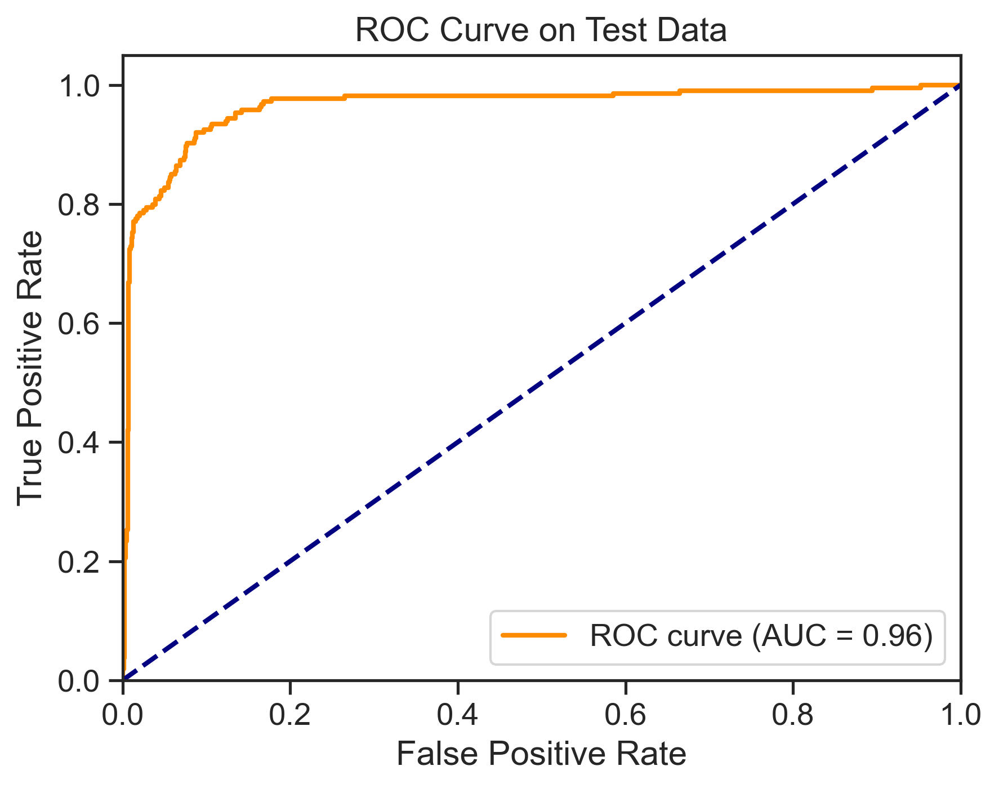

In [245]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

X_test = test[['feature_1', 'feature_2', 'feature_3', 'feature_4',
               'feature_1_x_feature_2', 'feature_1_x_feature_3',
               'feature_2_x_feature_3', 'feature_2_x_feature_4',
               'feature_3_x_feature_4']]
y_test = test['y']
y_pred_proba = model.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve on Test Data')
plt.legend(loc="lower right")
plt.show()

optimal threshold 

In [246]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
fnr = 1 - tpr
optimal_idx = np.argmin(np.abs(fpr - fnr))
optimal_threshold = thresholds[optimal_idx]

print(f"Optimal threshold: {optimal_threshold:.3f}")

Optimal threshold: 0.307


In [247]:
from sklearn.metrics import confusion_matrix, recall_score

y_pred = (y_pred_proba >= optimal_threshold).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print(f"\nRecall at optimal threshold: {recall:.3f}")

Confusion Matrix:
[[771  74]
 [ 19 195]]

Recall at optimal threshold: 0.911


# EDA for features

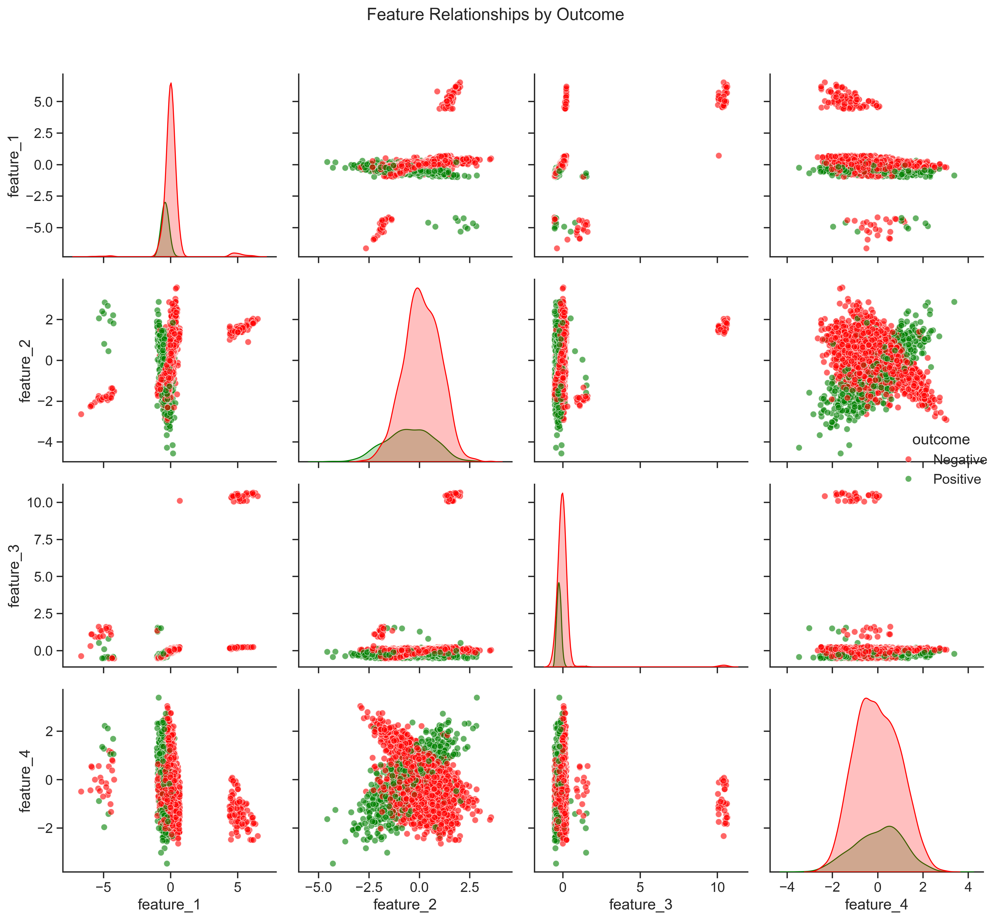

In [248]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

features = ['feature_1', 'feature_2', 'feature_3', 'feature_4']
train['outcome'] = train['y'].map({1: 'Positive', 0: 'Negative'})

sns.set(style="ticks", font_scale=1.2)
plot = sns.pairplot(train[features + ['outcome']], 
                   hue='outcome',
                   palette={'Positive': 'green', 'Negative': 'red'},
                   plot_kws={'alpha': 0.6, 'linewidth': 0.5},
                   diag_kind='kde',
                   height=3)

plot.fig.suptitle('Feature Relationships by Outcome', y=1.02, size=16)
plt.tight_layout()
plt.show()

Notice how the distributions of features 1 and 3 are very similar, and the distributions of features 1 and 4 are very similar. Where the distribution of feature 2 positives is shifted to the left of mean and the positives of feature 4 are shifted to the right of the mean 

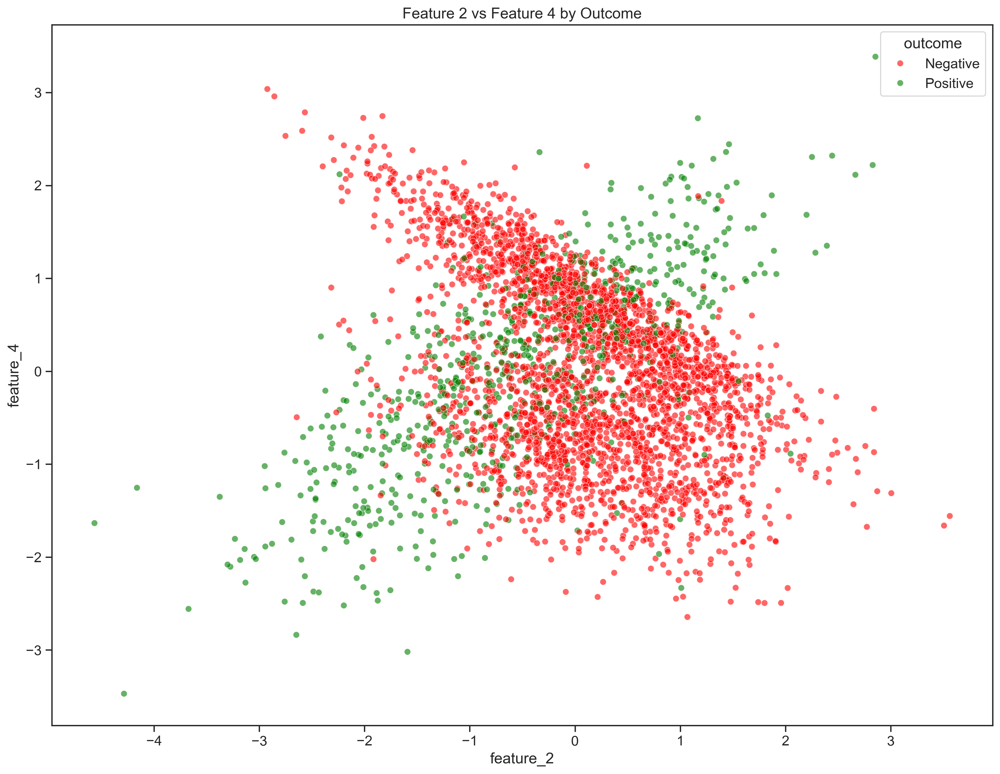

In [249]:
plt.figure(figsize=(16,12))
sns.scatterplot(data=train, x='feature_2', y='feature_4', hue='outcome', 
                palette={'Positive': 'green', 'Negative': 'red'}, alpha=0.6)
plt.title('Feature 2 vs Feature 4 by Outcome')
plt.show()

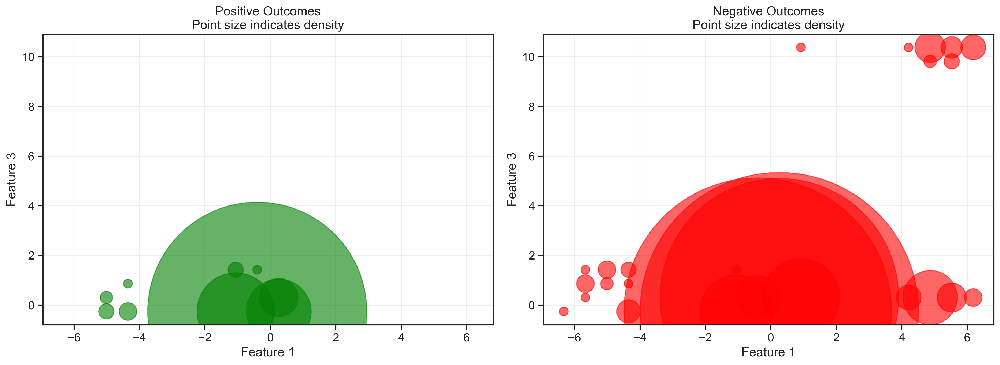

In [250]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6))

x_bins = np.linspace(train['feature_1'].min(), train['feature_1'].max(), 21)
y_bins = np.linspace(train['feature_3'].min(), train['feature_3'].max(), 21)

for outcome, color, ax in zip(['Positive', 'Negative'], ['green', 'red'], [ax1, ax2]):
    mask = train['outcome'] == outcome
    H, xedges, yedges = np.histogram2d(
        train.loc[mask, 'feature_1'],
        train.loc[mask, 'feature_3'],
        bins=[x_bins, y_bins]
    )
    
    xcenters = (xedges[:-1] + xedges[1:]) / 2
    ycenters = (yedges[:-1] + yedges[1:]) / 2
    
    X, Y = np.meshgrid(xcenters, ycenters)
    
    ax.scatter(X.flatten(), Y.flatten(), 
              s=H.T.flatten() * 100,
              c=color,
              alpha=0.6)
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 3')
    ax.set_title(f'{outcome} Outcomes\nPoint size indicates density')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Optimization terminated successfully.
         Current function value: 0.393480
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.393480
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.393480
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.393480
         Iterations 8


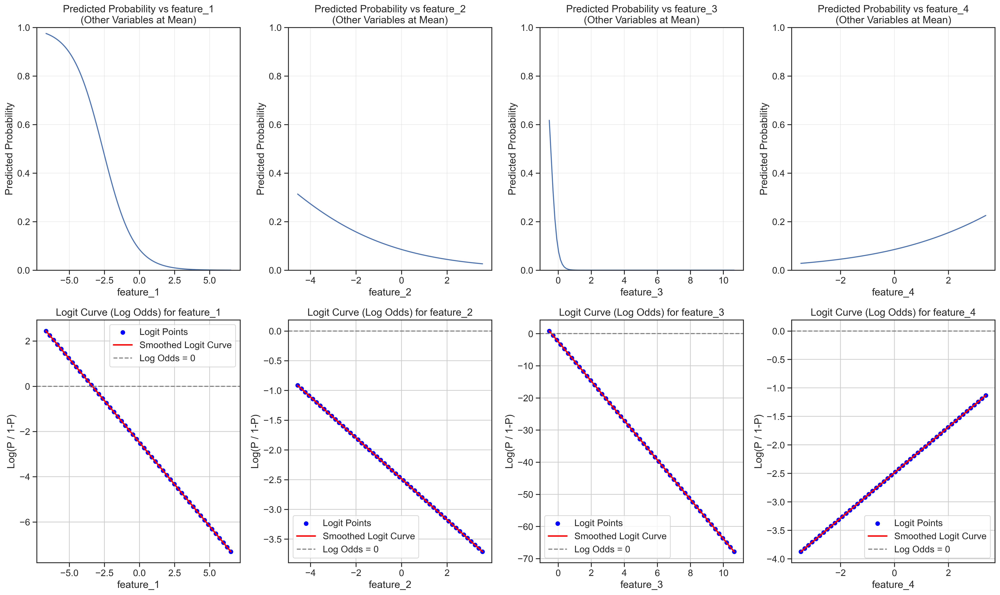

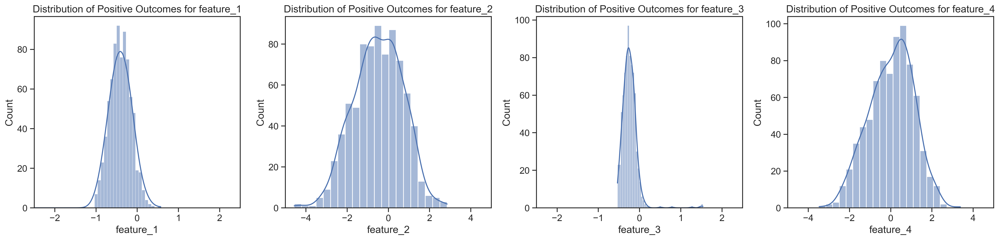

In [251]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm

X = train[['feature_1', 'feature_2', 'feature_3', 'feature_4']]
y = train['y']

lr_model = LogisticRegression(random_state=42)
lr_model.fit(X, y)

# First figure for probability and log odds plots
fig1, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(20, 12))

mean_values = X.mean()

for i, feature in enumerate(['feature_1', 'feature_2', 'feature_3', 'feature_4']):
    x_range = np.linspace(X[feature].min(), X[feature].max(), 100)
    
    pred_data = np.tile(mean_values, (100, 1))
    pred_data = pd.DataFrame(pred_data, columns=X.columns)
    pred_data[feature] = x_range
    
    y_pred = lr_model.predict_proba(pred_data)[:, 1]
    
    axes_top = [ax1, ax2, ax3, ax4]
    axes_top[i].plot(x_range, y_pred)
    axes_top[i].set_title(f'Predicted Probability vs {feature}\n(Other Variables at Mean)')
    axes_top[i].set_ylabel('Predicted Probability')
    axes_top[i].set_xlabel(feature)
    axes_top[i].grid(True, alpha=0.3)
    axes_top[i].set_ylim(0, 1)
    
    X_with_const = sm.add_constant(X)
    logit_model = sm.Logit(y, X_with_const)
    result = logit_model.fit()
    
    feature_values = np.linspace(X[feature].min(), X[feature].max(), 50)
    fixed_predictors = mean_values.copy()
    log_odds = []
    
    for value in feature_values:
        temp_predictors = fixed_predictors.copy()
        temp_predictors[feature] = value
        predictors_with_const = sm.add_constant(temp_predictors.values.reshape(1, -1), has_constant='add')
        logit = np.dot(predictors_with_const, result.params)
        log_odds.append(logit[0])
    
    plot_df = pd.DataFrame({
        feature: feature_values,
        'log_odds': log_odds
    })
    
    axes_bottom = [ax5, ax6, ax7, ax8]
    sns.scatterplot(x=feature, y='log_odds', data=plot_df, color='blue', s=50, 
                    ax=axes_bottom[i], label='Logit Points')
    sns.regplot(x=feature, y='log_odds', data=plot_df, scatter=False, lowess=True,
                color='red', line_kws={'lw': 2}, ax=axes_bottom[i], label='Smoothed Logit Curve')
    
    axes_bottom[i].set_title(f'Logit Curve (Log Odds) for {feature}')
    axes_bottom[i].set_xlabel(feature)
    axes_bottom[i].set_ylabel('Log(P / 1-P)')
    axes_bottom[i].axhline(0, color='grey', linestyle='--', label='Log Odds = 0')
    axes_bottom[i].legend()
    axes_bottom[i].grid(True)

plt.tight_layout()
plt.show()

# Second figure for distributions
fig2, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 5))

feature_ranges = {
    'feature_1': (-2.5, 2.5),
    'feature_2': (-5, 5),
    'feature_3': (-2.5, 2.5),
    'feature_4': (-5, 5)
}

for i, feature in enumerate(['feature_1', 'feature_2', 'feature_3', 'feature_4']):
    min_val, max_val = feature_ranges[feature]
    positive_data = train[train['y'] == 1][feature]
    sns.histplot(data=positive_data, ax=[ax1, ax2, ax3, ax4][i], kde=True)
    [ax1, ax2, ax3, ax4][i].set_title(f'Distribution of Positive Outcomes for {feature}')
    [ax1, ax2, ax3, ax4][i].set_xlabel(feature)
    [ax1, ax2, ax3, ax4][i].set_ylabel('Count')
    [ax1, ax2, ax3, ax4][i].set_xlim(min_val, max_val)

plt.tight_layout()
plt.show()

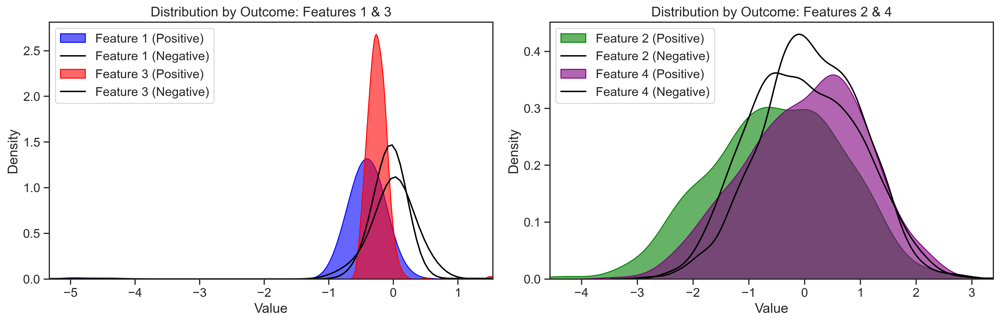

In [252]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

positive_data = train[train['y'] == 1]
negative_data = train[train['y'] == 0]

# Get x-axis limits from positive data only
x_lim1_min = min(positive_data['feature_1'].min(), positive_data['feature_3'].min())
x_lim1_max = max(positive_data['feature_1'].max(), positive_data['feature_3'].max())
x_lim2_min = min(positive_data['feature_2'].min(), positive_data['feature_4'].min())
x_lim2_max = max(positive_data['feature_2'].max(), positive_data['feature_4'].max())

sns.kdeplot(data=positive_data['feature_1'], ax=ax1, fill=True, alpha=0.6, label='Feature 1 (Positive)', color='blue')
sns.kdeplot(data=negative_data['feature_1'], ax=ax1, fill=False, alpha=1, label='Feature 1 (Negative)', color='black')
sns.kdeplot(data=positive_data['feature_3'], ax=ax1, fill=True, alpha=0.6, label='Feature 3 (Positive)', color='red')
sns.kdeplot(data=negative_data['feature_3'], ax=ax1, fill=False, alpha=1, label='Feature 3 (Negative)', color='black')
ax1.set_title('Distribution by Outcome: Features 1 & 3')
ax1.set_xlabel('Value')
ax1.set_ylabel('Density')
ax1.set_xlim(x_lim1_min, x_lim1_max)
ax1.legend()

sns.kdeplot(data=positive_data['feature_2'], ax=ax2, fill=True, alpha=0.6, label='Feature 2 (Positive)', color='green')
sns.kdeplot(data=negative_data['feature_2'], ax=ax2, fill=False, alpha=1, label='Feature 2 (Negative)', color='black')
sns.kdeplot(data=positive_data['feature_4'], ax=ax2, fill=True, alpha=0.6, label='Feature 4 (Positive)', color='purple')
sns.kdeplot(data=negative_data['feature_4'], ax=ax2, fill=False, alpha=1, label='Feature 4 (Negative)', color='black')
ax2.set_title('Distribution by Outcome: Features 2 & 4')
ax2.set_xlabel('Value')
ax2.set_ylabel('Density')
ax2.set_xlim(x_lim2_min, x_lim2_max)
ax2.legend()

plt.tight_layout()
plt.show()


for features 1 and 3, the distributions of positives and negatives are fundamentally different. For features 2 and 4 they are not incredibly different, however there is is a incredibly strong pattern of posative outcomes where feature 2 and 4 are increasing at a proportional rate.

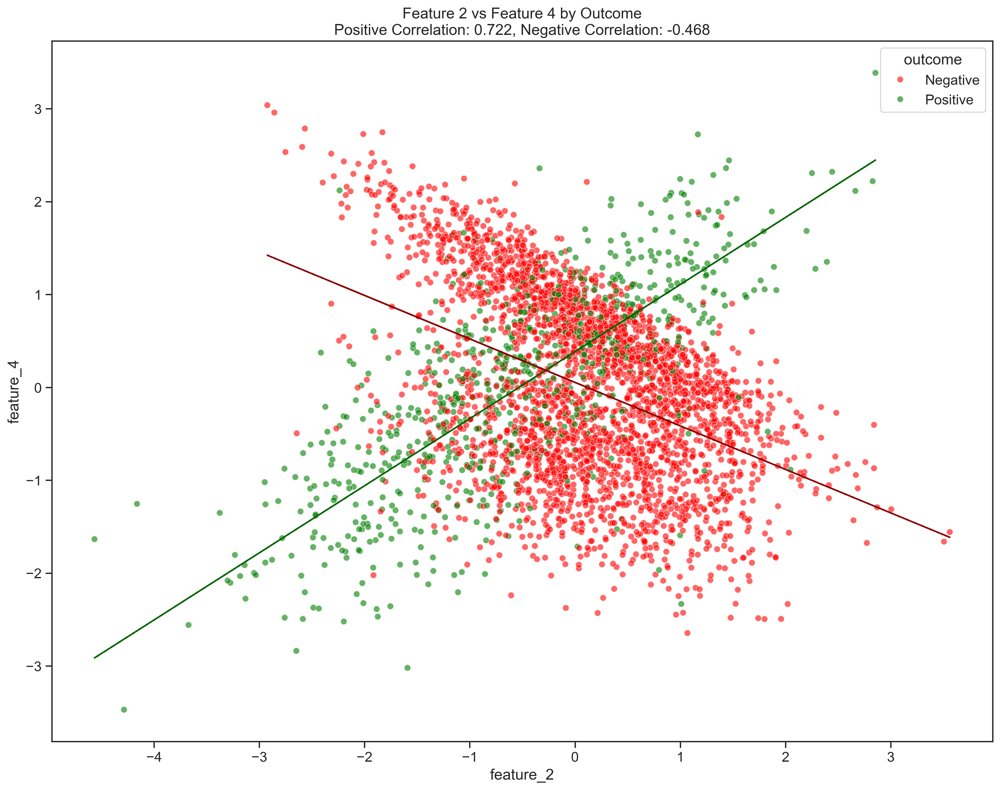

In [257]:
plt.figure(figsize=(16,12))

positive_data = train[train['y'] == 1]
negative_data = train[train['y'] == 0]

pos_corr = positive_data['feature_2'].corr(positive_data['feature_4'])
neg_corr = negative_data['feature_2'].corr(negative_data['feature_4'])

sns.scatterplot(data=train, x='feature_2', y='feature_4', hue='outcome',
                palette={'Positive': 'green', 'Negative': 'red'}, alpha=0.6)

# Add correlation lines
x_pos = positive_data['feature_2']
y_pos = pos_corr * x_pos + (positive_data['feature_4'].mean() - pos_corr * positive_data['feature_2'].mean())
plt.plot(x_pos, y_pos, color='darkgreen', linestyle='--')

x_neg = negative_data['feature_2']
y_neg = neg_corr * x_neg + (negative_data['feature_4'].mean() - neg_corr * negative_data['feature_2'].mean())
plt.plot(x_neg, y_neg, color='darkred', linestyle='--')

plt.title(f'Feature 2 vs Feature 4 by Outcome\nPositive Correlation: {pos_corr:.3f}, Negative Correlation: {neg_corr:.3f}')
plt.show()

hence when we created an interaction term for variables 2 and 4, it's coefficient was the the strongest positive predictor of all of the variables by an enormous margin 

In [254]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

X_train = train[['feature_1', 'feature_2', 'feature_3', 'feature_4',
                 'feature_1_x_feature_2', 'feature_1_x_feature_3',
                 'feature_2_x_feature_3', 'feature_2_x_feature_4',
                 'feature_3_x_feature_4']]
y_train = train['y']

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

y_pred = model.predict(X_train)

print("Model Coefficients:")
for feature, coef in zip(X_train.columns, model.coef_[0]):
    print(f"{feature}: {coef:.4f}")
print(f"\nIntercept: {model.intercept_[0]:.4f}")
print("\nModel Performance:")
print(classification_report(y_train, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_train, y_pred))

Model Coefficients:
feature_1: -4.9340
feature_2: -3.1497
feature_3: -2.7889
feature_4: 0.9372
feature_1_x_feature_2: -7.2399
feature_1_x_feature_3: 0.9880
feature_2_x_feature_3: -1.2557
feature_2_x_feature_4: 2.2848
feature_3_x_feature_4: -2.4979

Intercept: -3.2491

Model Performance:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      2945
           1       0.97      0.68      0.80       782

    accuracy                           0.93      3727
   macro avg       0.95      0.84      0.88      3727
weighted avg       0.93      0.93      0.92      3727


Confusion Matrix:
[[2931   14]
 [ 251  531]]


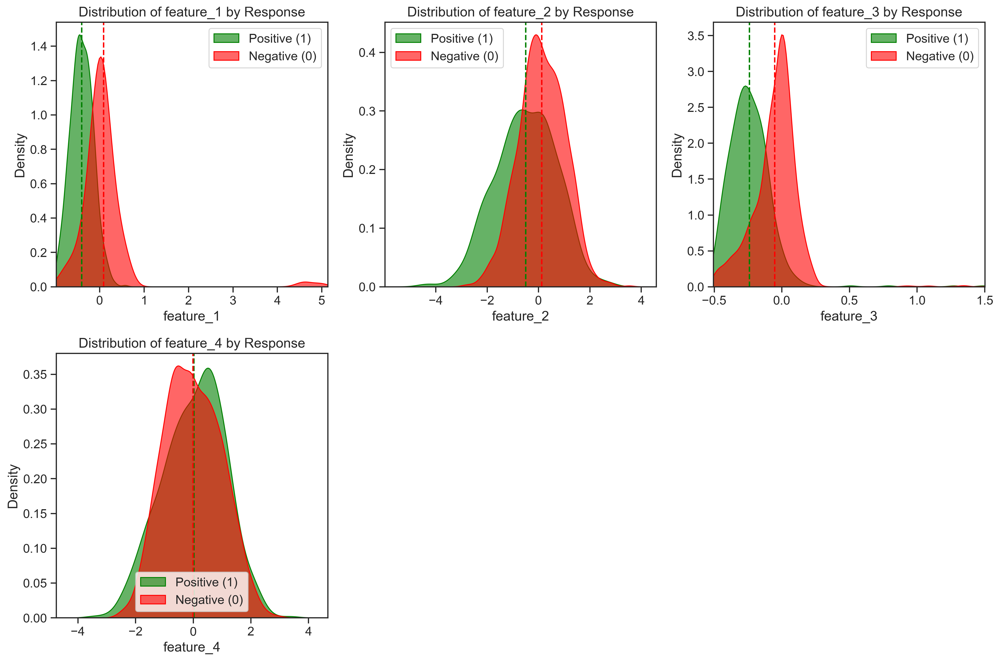

In [220]:
def ridge_plot_by_response(df, variables, categorical_var='target', positive_value=1, negative_value=0):
    n_vars = len(variables)
    n_rows = (n_vars + 2) // 3
    plt.figure(figsize=(15, 5*n_rows))
    
    for i, var in enumerate(variables):
        plt.subplot(n_rows, 3, i + 1)
        
        if var in ['feature_1', 'feature_3']:
            lower = np.percentile(df[var], 1)
            upper = np.percentile(df[var], 99)
            df_filtered = df[(df[var] >= lower) & (df[var] <= upper)]
            
            pos_data = df_filtered[df_filtered[categorical_var] == positive_value]
            neg_data = df_filtered[df_filtered[categorical_var] == negative_value]
            
            sns.kdeplot(data=pos_data, x=var,
                        fill=True, alpha=0.6, label=f'Positive ({positive_value})', color='green')
            sns.kdeplot(data=neg_data, x=var,
                        fill=True, alpha=0.6, label=f'Negative ({negative_value})', color='red')
            
            pos_mean = pos_data[var].mean()
            neg_mean = neg_data[var].mean()
            
            plt.axvline(pos_mean, color='green', linestyle='--')
            plt.axvline(neg_mean, color='red', linestyle='--')
            
            plt.xlim(lower, upper)
        else:
            pos_data = df[df[categorical_var] == positive_value]
            neg_data = df[df[categorical_var] == negative_value]
            
            sns.kdeplot(data=pos_data, x=var,
                        fill=True, alpha=0.6, label=f'Positive ({positive_value})', color='green')
            sns.kdeplot(data=neg_data, x=var,
                        fill=True, alpha=0.6, label=f'Negative ({negative_value})', color='red')
            
            pos_mean = pos_data[var].mean()
            neg_mean = neg_data[var].mean()
            
            plt.axvline(pos_mean, color='green', linestyle='--')
            plt.axvline(neg_mean, color='red', linestyle='--')
        
        plt.title(f'Distribution of {var} by Response')
        plt.xlabel(var)
        plt.ylabel('Density')
        plt.legend()
    
    plt.tight_layout()
    plt.show()

variables = ['feature_1', 'feature_2', 'feature_3', 'feature_4']
ridge_plot_by_response(train, variables, categorical_var='y', positive_value=1, negative_value=0)

Optimization terminated successfully.
         Current function value: 0.277870
         Iterations 11
Optimization terminated successfully.
         Current function value: 0.402580
         Iterations 18
Optimization terminated successfully.
         Current function value: 0.458746
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.377064
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.365151
         Iterations 8
Optimization terminated successfully.
         Current function value: 0.395740
         Iterations 9


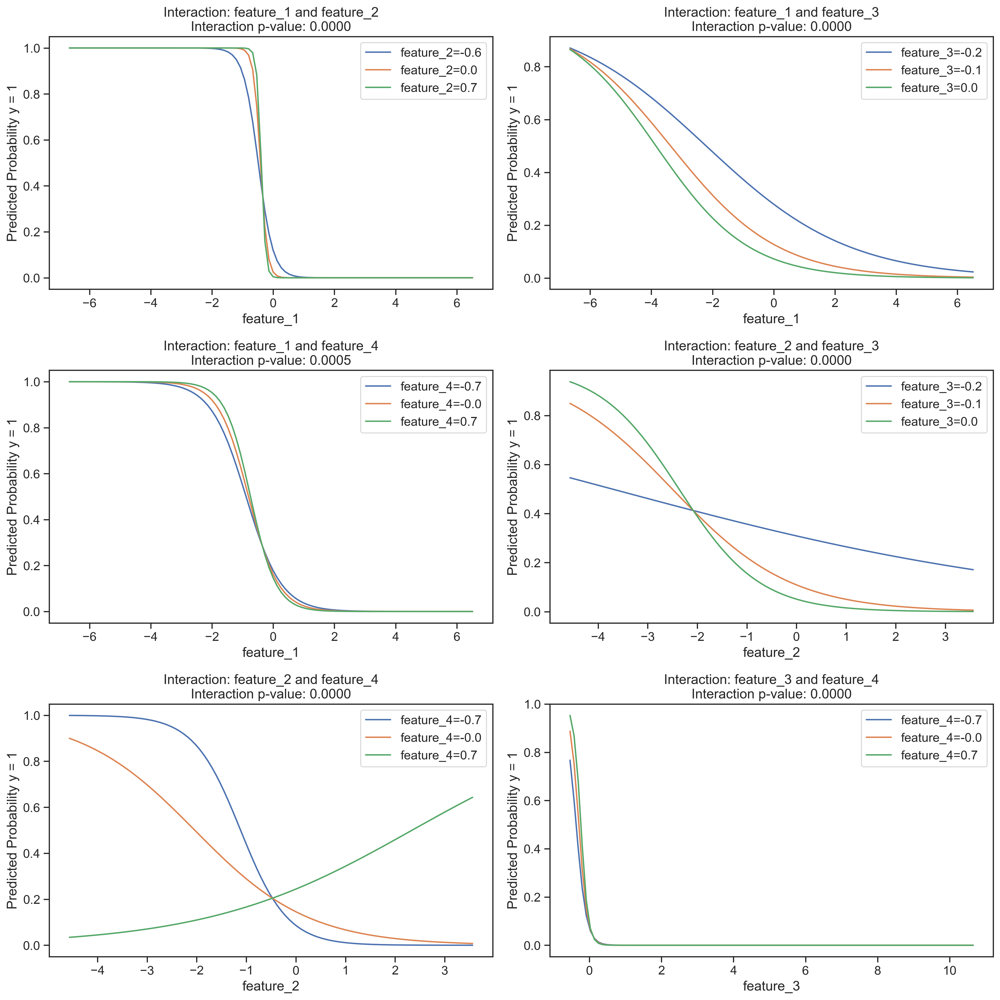


Significant interactions (p < 0.05):
feature_1 x feature_2
feature_1 x feature_3
feature_1 x feature_4
feature_2 x feature_3
feature_2 x feature_4
feature_3 x feature_4


In [221]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

variables = ['feature_1', 'feature_2', 'feature_3', 'feature_4']

n_pairs = len(variables) * (len(variables) - 1) // 2
n_rows = (n_pairs + 1) // 2
fig, axes = plt.subplots(n_rows, 2, figsize=(15, 5*n_rows))
axes = axes.flatten()

significant_interactions = []
plot_idx = 0

for i, var1 in enumerate(variables):
    for j, var2 in enumerate(variables[i+1:], i+1):
        formula = f'y ~ {var1} * {var2}'
        model = sm.Logit.from_formula(formula, data=train).fit()
        
        interaction_pvalue = model.pvalues[f'{var1}:{var2}']
        
        if interaction_pvalue < 0.05:
            significant_interactions.append((var1, var2))
        
        var1_values = np.linspace(train[var1].min(), train[var1].max(), 100)
        var2_levels = np.percentile(train[var2], [25, 50, 75])
        
        for var2_level in var2_levels:
            df = pd.DataFrame({
                var1: var1_values,
                var2: var2_level
            })
            df['interaction'] = df[var1] * df[var2]
            df['predicted_prob'] = model.predict(sm.add_constant(df))
            
            axes[plot_idx].plot(df[var1], df['predicted_prob'], 
                              label=f'{var2}={var2_level:.1f}')
        
        axes[plot_idx].set_xlabel(var1)
        axes[plot_idx].set_ylabel('Predicted Probability y = 1')
        axes[plot_idx].legend()
        axes[plot_idx].set_title(f'Interaction: {var1} and {var2}\nInteraction p-value: {interaction_pvalue:.4f}')
        plot_idx += 1

for idx in range(plot_idx, len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

print("\nSignificant interactions (p < 0.05):")
for var1, var2 in significant_interactions:
    print(f"{var1} x {var2}")

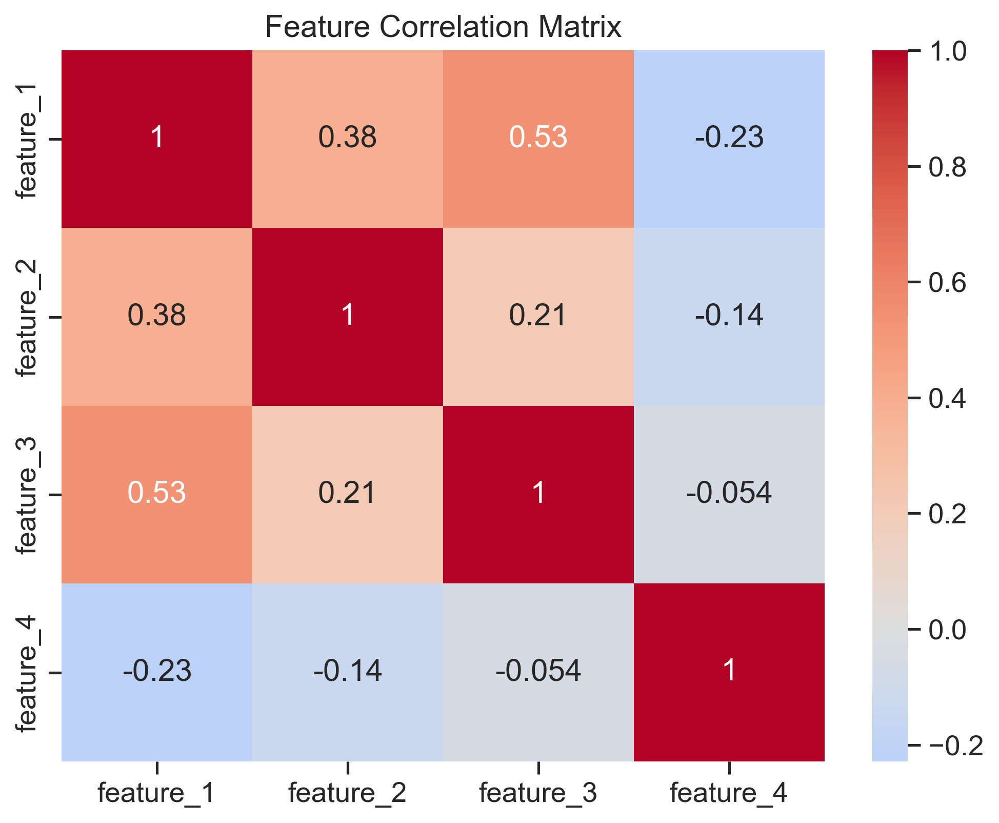

In [222]:
# Feature Correlation Matrix
correlation_matrix = train[['feature_1', 'feature_2', 'feature_3', 'feature_4']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Feature Correlation Matrix')
plt.show()

53% correlation between features 1 and 3. If you remove either feature 1 or 3 the model performance drops no matter how you try to configure interaction terms.

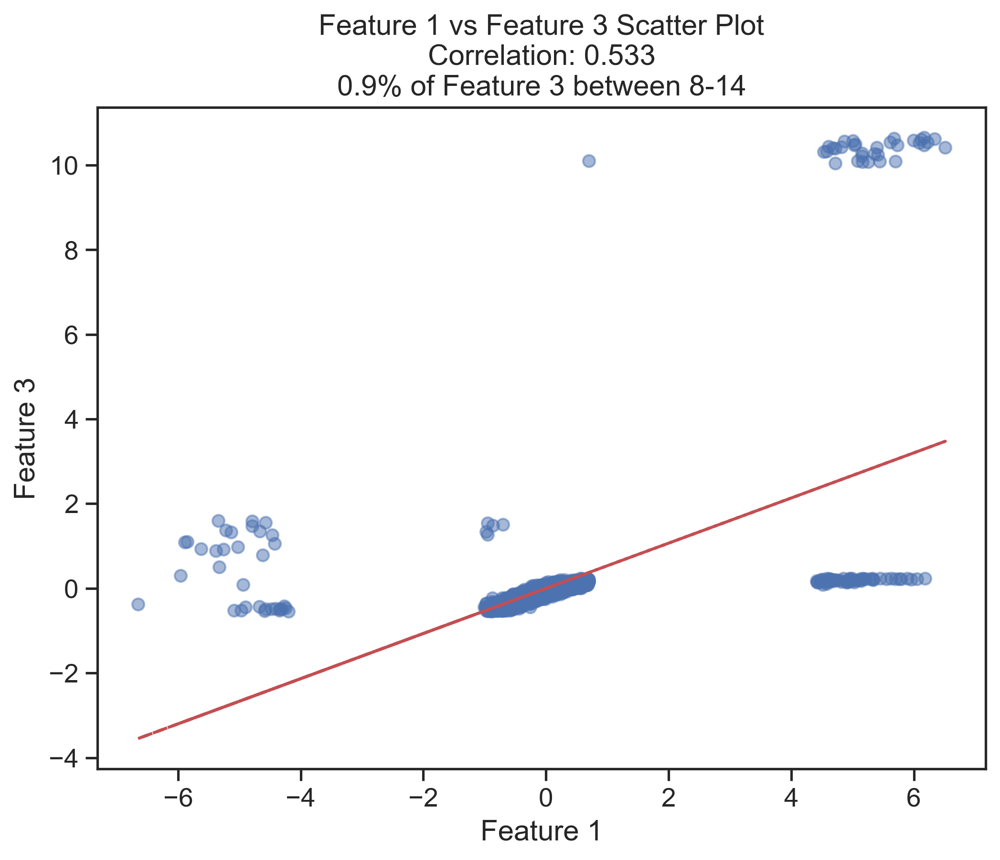

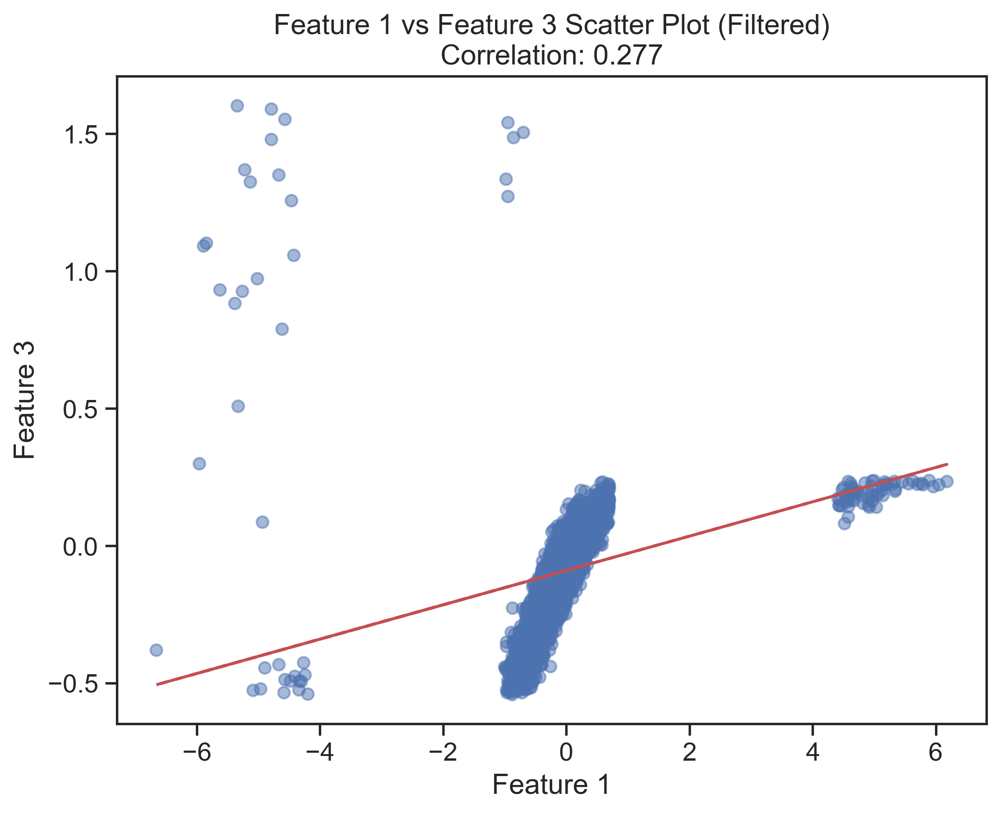

In [228]:
plt.figure(figsize=(8, 6))
plt.scatter(train['feature_1'], train['feature_3'], alpha=0.5)
z = np.polyfit(train['feature_1'], train['feature_3'], 1)
p = np.poly1d(z)
plt.plot(train['feature_1'], p(train['feature_1']), "r--")
corr = train['feature_1'].corr(train['feature_3'])
pct_between = (train['feature_3'][(train['feature_3'] >= 8) & (train['feature_3'] <= 14)].count() / train['feature_3'].count()) * 100
plt.xlabel('Feature 1')
plt.ylabel('Feature 3')
plt.title(f'Feature 1 vs Feature 3 Scatter Plot\nCorrelation: {corr:.3f}\n{pct_between:.1f}% of Feature 3 between 8-14')
plt.show()

filtered_data = train[~((train['feature_3'] >= 8) & (train['feature_3'] <= 14))]
plt.figure(figsize=(8, 6))
plt.scatter(filtered_data['feature_1'], filtered_data['feature_3'], alpha=0.5)
z = np.polyfit(filtered_data['feature_1'], filtered_data['feature_3'], 1)
p = np.poly1d(z)
plt.plot(filtered_data['feature_1'], p(filtered_data['feature_1']), "r--")
corr = filtered_data['feature_1'].corr(filtered_data['feature_3'])
plt.xlabel('Feature 1')
plt.ylabel('Feature 3')
plt.title(f'Feature 1 vs Feature 3 Scatter Plot (Filtered)\nCorrelation: {corr:.3f}')
plt.show()


Features 1 and 3 are not actually highly correlated, those are outliers which constitute 1 % of the data 

# Random Forest Model 

In [224]:
from sklearn.ensemble import RandomForestClassifier
X_train = train[['feature_1', 'feature_2', 'feature_3', 'feature_4']]
y_train = train['y']
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train);

RF ROC Curve 

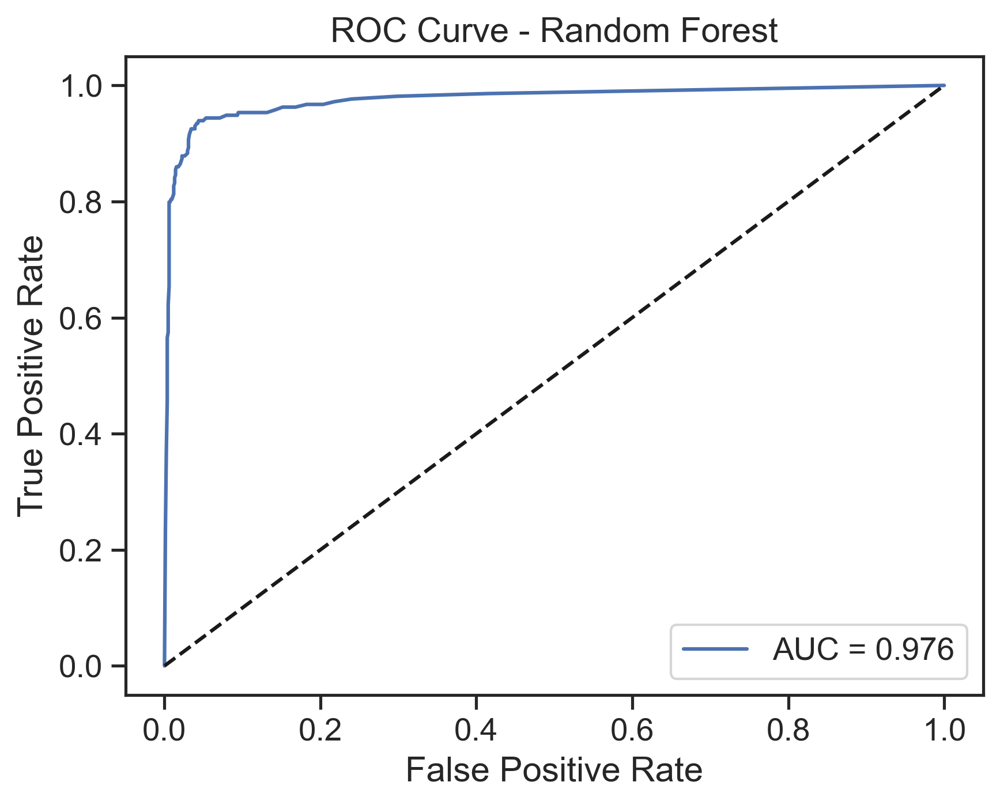

In [225]:
from sklearn.metrics import roc_auc_score
X_test = test[['feature_1', 'feature_2', 'feature_3', 'feature_4']]
y_test = test['y']

rf_pred_proba = rf_model.predict_proba(X_test)[:,1]

fpr, tpr, _ = roc_curve(y_test, rf_pred_proba)
auc_score = roc_auc_score(y_test, rf_pred_proba)

plt.figure()
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.3f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest')
plt.legend();

optimal threshold 

In [226]:
fpr, tpr, thresholds = roc_curve(y_test, rf_pred_proba)
fnr = 1 - tpr
optimal_idx = np.argmin(np.abs(fpr - fnr))
optimal_threshold = thresholds[optimal_idx]

print(f"Optimal threshold: {optimal_threshold:.3f}")

Optimal threshold: 0.230


recall at optimal threshold 

In [227]:
y_pred = (rf_pred_proba >= optimal_threshold).astype(int)
conf_matrix = confusion_matrix(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)
print(f"\nRecall at optimal threshold: {recall:.3f}")

Confusion Matrix:
[[797  48]
 [ 12 202]]

Recall at optimal threshold: 0.944
